In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import os
import time

## Question-1 Display the magnitude spectrum of Fourier Transform

In [2]:
def rectangle_img(top_left, bottom_right):
    img = np.zeros((100, 100), dtype=np.uint8)
    img[top_left[0]:bottom_right[0], top_left[1]:bottom_right[1]] = 255
    return img

In [3]:
def plot(titles, images, rows, cols):
    plt.figure(figsize=(15, 10))
    for i in range(len(images)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

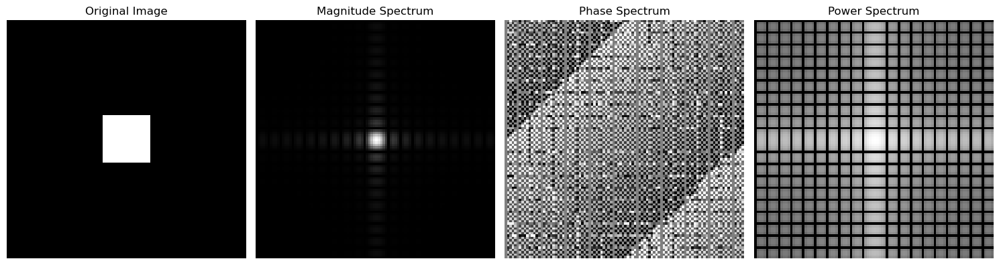

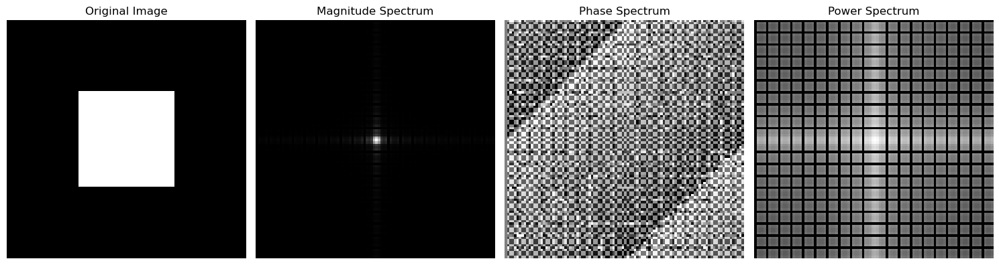

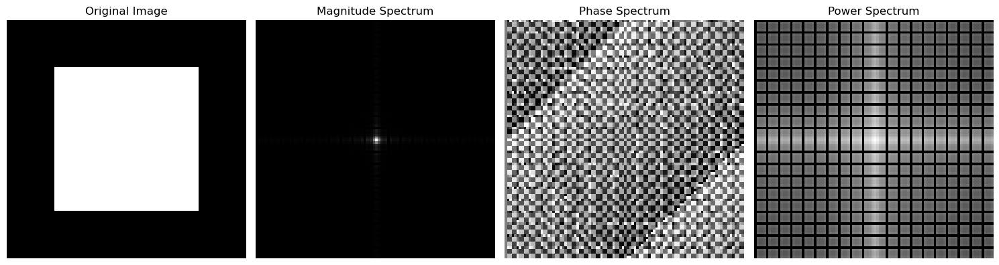

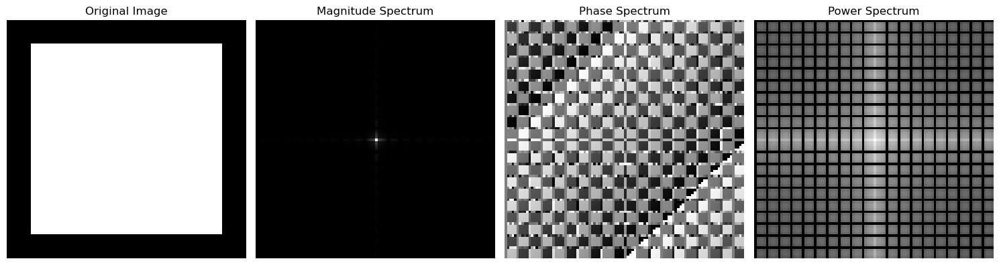

In [52]:
for i in range(1, 5):
    img1 = rectangle_img((50-i*10, 50-i*10), (50+i*10, 50+i*10))

    dft = cv.dft(np.float32(img1), flags=cv.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    magnitude_spectrum = cv.magnitude(dft_shift[:,:,0], dft_shift[:,:,1])
    phase_spectrum = np.angle(dft_shift[:,:,0] + 1j*dft_shift[:,:,1])
    power_spectrum = np.log1p(magnitude_spectrum**2)

    images = [img1, magnitude_spectrum, phase_spectrum, power_spectrum]
    titles = ['Original Image', 'Magnitude Spectrum', 'Phase Spectrum', 'Power Spectrum']
    plot(titles, images, 1, 4)

### (b) Effect of size of rectangle on spectrum  
#### Observation from Images

As the white square becomes larger from top to bottom:
1. The magnitude spectrum becomes more concentrated around the center.
2. The frequency components appear denser, with the high-frequency components decreasing in intensity.
3. The phase spectrum gets more detailed, reflecting more structural orientation.
4. The power spectrum shows stronger low-frequency dominance.

---

### Explanation

#### 1. Magnitude Spectrum
- The white square is a spatial signal.
- A larger square → corresponds to a lower frequency signal → hence, its frequency representation (magnitude) is more concentrated in the center (DC component).
- A smaller square → contains more sharp edges → resulting in higher frequency components, hence a spread-out magnitude spectrum.

#### 2. Phase Spectrum
- The phase spectrum reflects spatial positioning and geometry.
- As the square grows, the phase pattern changes, but retains its structure due to the square's symmetry.
- Small squares = more phase variations due to sharper boundaries.

#### 3. Power Spectrum
- Similar behavior to the magnitude spectrum: large rectangles concentrate power in low frequencies, small ones distribute it more.

## Question-2 Filters in Spatial and Frequency Domain

In [59]:
class Timer:
    def __init__(self, name):
        self.name = name

    def __enter__(self):
        self._start_time = time.perf_counter()
        return self
    
    def __exit__(self, exc_type, exc_val, exc_tb):
        self._end_time = time.perf_counter()
        elapsed_time = self._end_time - self._start_time
        print(f"Elapsed Time: {elapsed_time:.10f}s")

In [60]:
cameraman = cv.imread('../Assignment-4/Filtering/cameraman.jpg', cv.IMREAD_GRAYSCALE)
assert cameraman is not None

In [61]:
with Timer('Time for spatial filter') as timer:
    print(timer.name)
    kernel = np.ones((11, 11), dtype=np.float32) / 121
    cameraman_fil = cv.filter2D(cameraman, -1, kernel)

Time for spatial filter
Elapsed Time: 0.0022464020s


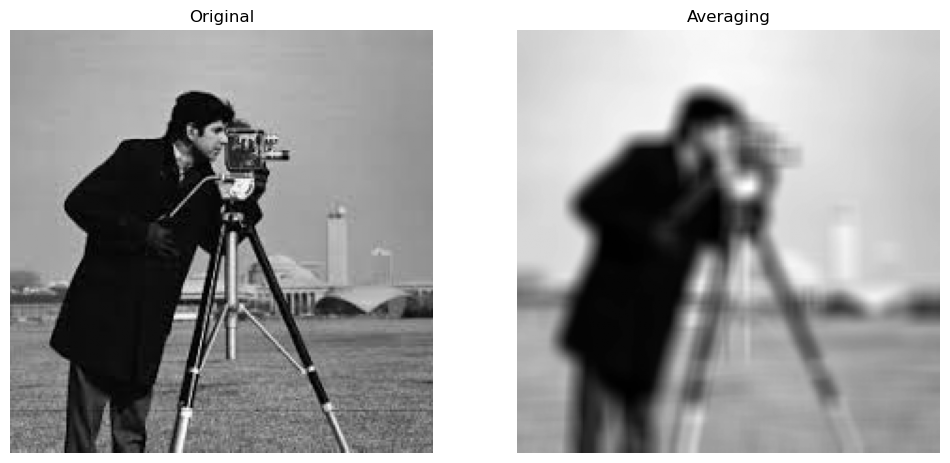

In [62]:
plt.figure(figsize=(12, 10))
plt.subplot(121)
plt.imshow(cameraman, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(122)
plt.imshow(cameraman_fil, cmap='gray')
plt.title('Averaging')
plt.axis('off')

plt.show()

Time for frequency filter
Elapsed Time: 0.0624693140s


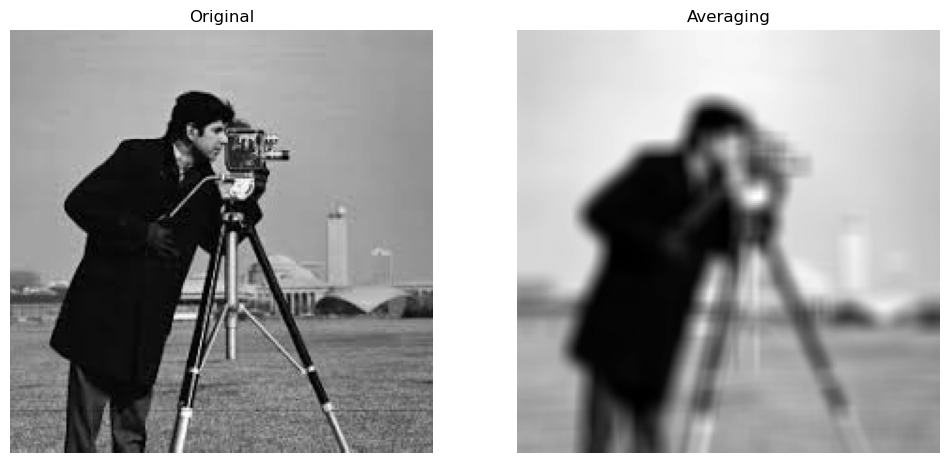

In [63]:
with Timer('Time for frequency filter') as timer:
    print(timer.name)
    # Size of the image
    H, W = cameraman.shape

    # Padded Size
    P, Q = 2 * H, 2 * W

    # Padding the image
    padded_img = np.pad(cameraman, ((H//2, H-H//2), (W//2, W-W//2)), mode='symmetric')

    # Pad the kernel to match padded image size
    padded_kernel = np.zeros((P, Q), dtype=np.float32)
    padded_kernel[:kernel.shape[0], :kernel.shape[1]] = kernel

    # FFT of image and kernel
    dft_img = np.fft.fft2(padded_img)
    dft_kernel = np.fft.fft2(padded_kernel)

    # Multiply in frequency domain
    dft_result = dft_img * dft_kernel

    # Inverse FFT
    filtered = np.fft.ifft2(dft_result)
    filtered = np.abs(filtered)

    # Crop back to original image size
    start_row = (P - H) // 2
    start_col = (Q - W) // 2
    filtered_cropped = filtered[start_row:start_row + H, start_col:start_col + W]

    # Convert to displayable format
    filtered_img = np.uint8(np.clip(filtered_cropped, 0, 255))

# Display the results
plt.figure(figsize=(12, 10))
plt.subplot(121)
plt.imshow(cameraman, cmap='gray')
plt.title('Original')
plt.axis('off')

plt.subplot(122)
plt.imshow(filtered_img, cmap='gray')
plt.title('Averaging')
plt.axis('off')

plt.show()

Time taken in Spatial Domain is lesser compared to time taken in frequency domain because of the extra calculation we needed to do for converting the image and kernel into Frequency Domain.

## Question-3 Edge Detection

In [52]:
building_img = cv.imread('./building.jpg', cv.IMREAD_GRAYSCALE)
assert building_img is not None

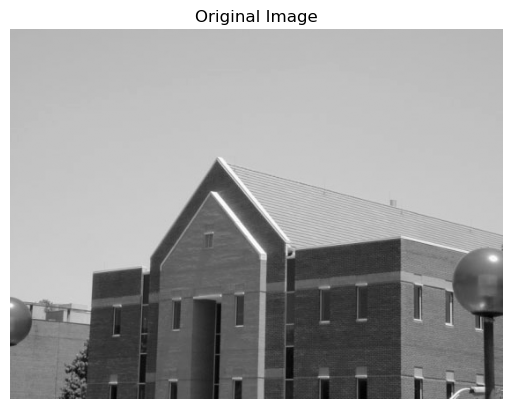

In [53]:
plt.imshow(building_img, cmap='gray')
plt.axis('off')
plt.title('Original Image')
plt.show()

### Sobel kernel

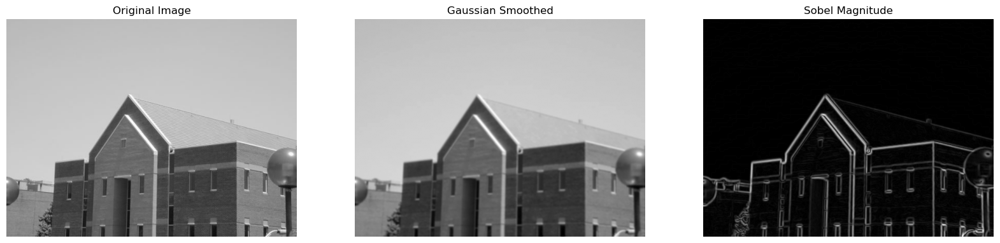

In [54]:
# Step 1: Apply Gaussian smoothing
blurred = cv.GaussianBlur(building_img, (5, 5), 1.4)

# Step 2: Apply Sobel operators in x and y directions
sobelx = cv.Sobel(blurred, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(blurred, cv.CV_64F, 0, 1, ksize=3)

# Step 3: Compute gradient magnitude and direction
magnitude = np.sqrt(sobelx**2 + sobely**2)
direction = np.arctan2(sobely, sobelx) * (180 / np.pi)

# Normalize magnitude to 0-255 range for visualization
magnitude_norm = cv.normalize(magnitude, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

# Display the results
plt.figure(figsize=(20, 12))

plt.subplot(131)
plt.imshow(cv.cvtColor(building_img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(blurred, cmap='gray')
plt.title('Gaussian Smoothed')
plt.axis('off')

plt.subplot(133)
plt.imshow(magnitude_norm, cmap='gray')
plt.title('Sobel Magnitude')
plt.axis('off')

plt.show()

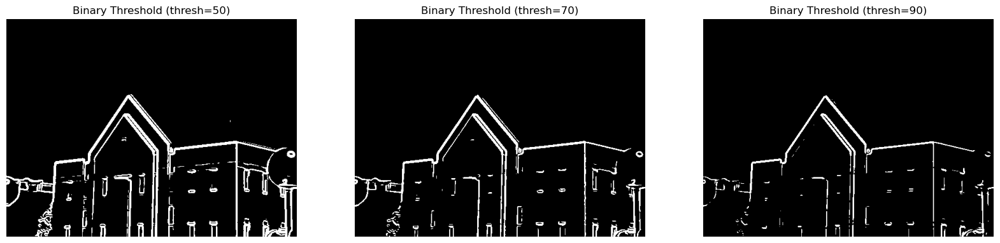

In [55]:
# Step 4: Apply thresholding
threshold_values = [50, 70, 90]

plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    _, binary_edges = cv.threshold(magnitude_norm, threshold_value, 255, cv.THRESH_BINARY)

    plt.subplot(1,3,i+1)
    plt.imshow(binary_edges, cmap='gray')
    plt.title(f'Binary Threshold (thresh={threshold_value})')
    plt.axis('off')
plt.show()

Sobel has alot of noise and thus after thresholding it is missing curves and edges. And it has overlapping edges.

### LoG 

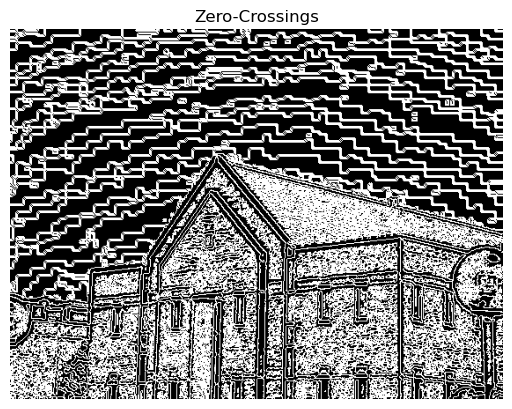

In [56]:
# Apply Laplacian after Gaussian smoothing
log = cv.Laplacian(blurred, cv.CV_64F, ksize=3)

# Find zero-crossings
log_zero_cross = np.zeros_like(log, dtype=np.uint8)
log_zero_cross[np.where(np.diff(np.sign(log), axis=0))] = 255
log_zero_cross[np.where(np.diff(np.sign(log), axis=1))] = 255

plt.imshow(log_zero_cross, cmap='gray')
plt.title('Zero-Crossings')
plt.axis('off')
plt.show()

### Canny Edge Detection

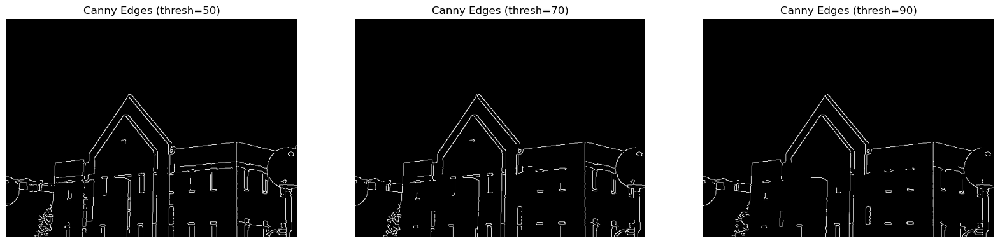

In [57]:
# Apply Canny
threshold_values = [50, 70, 90]
plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    canny_edges = cv.Canny(blurred, threshold_value, 2*threshold_value)
    plt.subplot(1,3,i+1)
    plt.imshow(canny_edges, cmap='gray')
    plt.title(f'Canny Edges (thresh={threshold_value})')
    plt.axis('off')
plt.show()

### Hough Lines

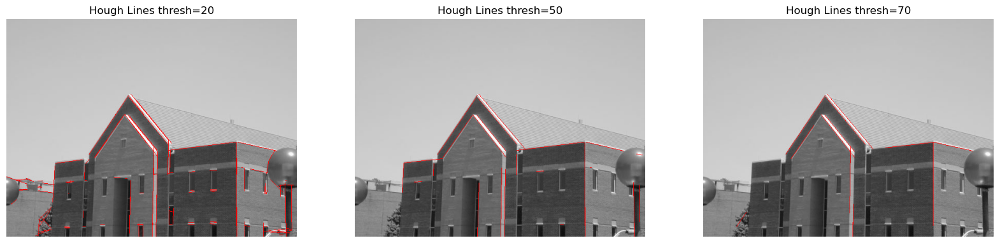

In [58]:
threshold_values = [20, 50, 70]
plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    lines = cv.HoughLinesP(canny_edges, 1, np.pi / 180, threshold=threshold_value, maxLineGap=10)
    hough_result = cv.cvtColor(building_img, cv.COLOR_GRAY2BGR)
    if lines is not None:
        for x1, y1, x2, y2 in lines[:, 0]:
            cv.line(hough_result, (x1, y1), (x2, y2), (255, 0, 0), 1)

    plt.subplot(1, 3, i+1)
    plt.imshow(hough_result, cmap='gray')
    plt.title(f'Hough Lines thresh={threshold_value}')
    plt.axis('off')
plt.show()

Canny edge detection is working the best for detecting the edges and curve of street light.

### Explanation 
- Canny is thinning out the edges using Non-Maximum suppression 
- And Double thresholding is able to find out strong edges and connected weak edges.

### For `objects.png` file

In [64]:
objects_img = cv.imread('./objects.png', cv.IMREAD_GRAYSCALE)
assert objects_img is not None

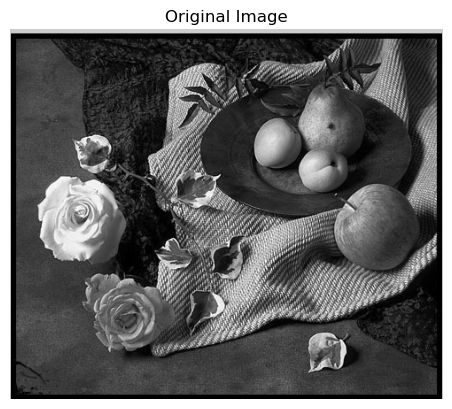

In [65]:
plt.imshow(objects_img, cmap='gray')
plt.axis('off')
plt.title('Original Image')
plt.show()

### Sobel kernel

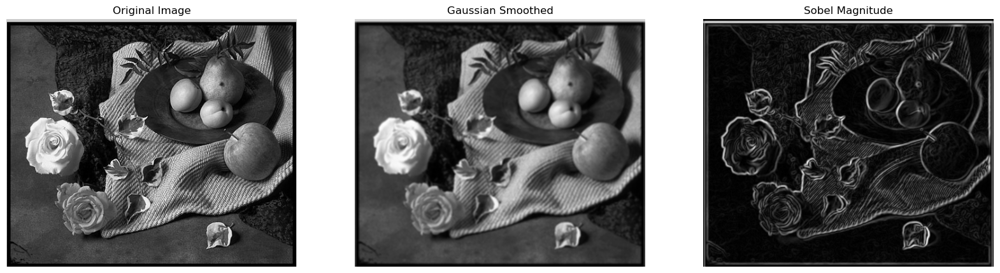

In [66]:
# Step 1: Apply Gaussian smoothing
blurred = cv.GaussianBlur(objects_img, (5, 5), 1.4)

# Step 2: Apply Sobel operators in x and y directions
sobelx = cv.Sobel(blurred, cv.CV_64F, 1, 0, ksize=3)
sobely = cv.Sobel(blurred, cv.CV_64F, 0, 1, ksize=3)

# Step 3: Compute gradient magnitude and direction
magnitude = np.sqrt(sobelx**2 + sobely**2)
direction = np.arctan2(sobely, sobelx) * (180 / np.pi)

# Normalize magnitude to 0-255 range for visualization
magnitude_norm = cv.normalize(magnitude, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

# Display the results
plt.figure(figsize=(20, 12))

plt.subplot(131)
plt.imshow(cv.cvtColor(objects_img, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(132)
plt.imshow(blurred, cmap='gray')
plt.title('Gaussian Smoothed')
plt.axis('off')

plt.subplot(133)
plt.imshow(magnitude_norm, cmap='gray')
plt.title('Sobel Magnitude')
plt.axis('off')

plt.show()

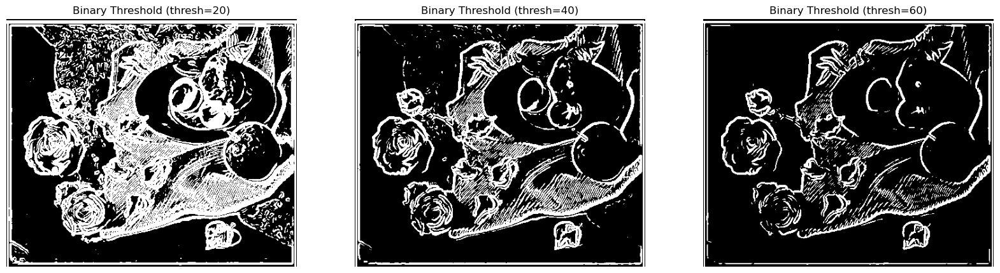

In [69]:
# Step 4: Apply thresholding
threshold_values = [20, 40, 60]

plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    _, binary_edges = cv.threshold(magnitude_norm, threshold_value, 255, cv.THRESH_BINARY)

    plt.subplot(1,3,i+1)
    plt.imshow(binary_edges, cmap='gray')
    plt.title(f'Binary Threshold (thresh={threshold_value})')
    plt.axis('off')
plt.show()

### LoG 

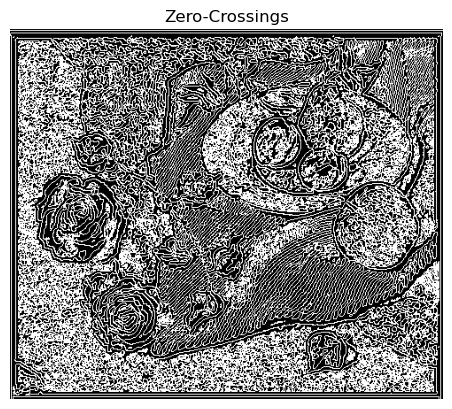

In [32]:
# Apply Laplacian after Gaussian smoothing
log = cv.Laplacian(blurred, cv.CV_64F, ksize=3)

# Find zero-crossings
log_zero_cross = np.zeros_like(log, dtype=np.uint8)
log_zero_cross[np.where(np.diff(np.sign(log), axis=0))] = 255
log_zero_cross[np.where(np.diff(np.sign(log), axis=1))] = 255

plt.imshow(log_zero_cross, cmap='gray')
plt.title('Zero-Crossings')
plt.axis('off')
plt.show()

### Canny Edge Detection

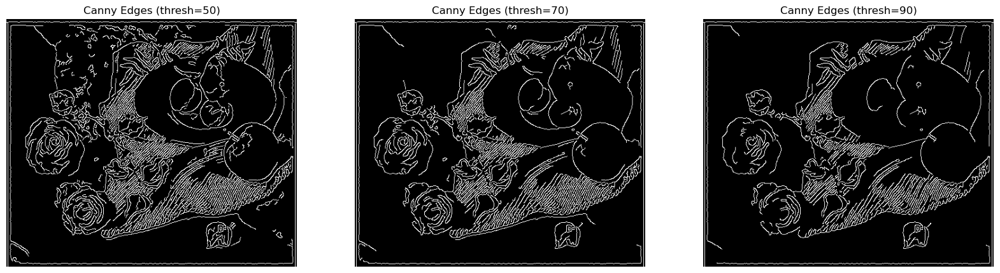

In [ ]:
# Apply Canny
threshold_values = [50, 70, 90]
plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    canny_edges = cv.Canny(blurred, threshold_value, 2*threshold_value)
    plt.subplot(1,3,i+1)
    plt.imshow(canny_edges, cmap='gray')
    plt.title(f'Canny Edges (thresh={threshold_value})')
    plt.axis('off')
plt.show()

### Hough Lines

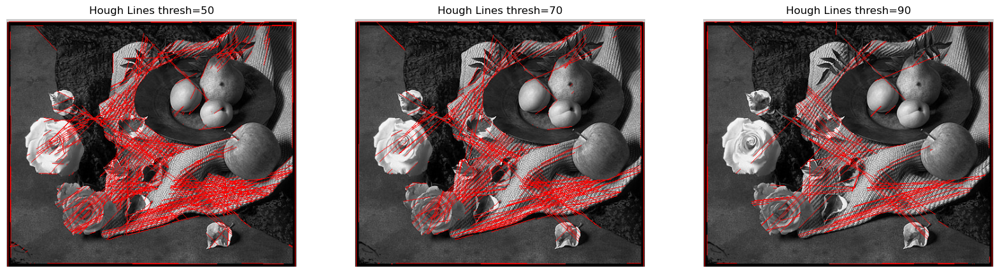

In [34]:
threshold_values = [50, 70, 90]
plt.figure(figsize=(20, 12))
for i, threshold_value in enumerate(threshold_values):
    lines = cv.HoughLinesP(canny_edges, 1, np.pi / 180, threshold=threshold_value, maxLineGap=10)
    hough_result = cv.cvtColor(building_img, cv.COLOR_GRAY2BGR)
    if lines is not None:
        for x1, y1, x2, y2 in lines[:, 0]:
            cv.line(hough_result, (x1, y1), (x2, y2), (255, 0, 0), 1)

    plt.subplot(1, 3, i+1)
    plt.imshow(hough_result, cmap='gray')
    plt.title(f'Hough Lines thresh={threshold_value}')
    plt.axis('off')
plt.show()

Canny edge detection is working the best for detecting the edges and curve of objects. Hough is not able to detect the curves.


### Explanation 
- Canny is thinning out the edges using Non-Maximum suppression 
- And Double thresholding is able to find out strong edges and connected weak edges.
- Hough only models lines not curves

## Question-4 Segmentation

In [23]:
def segmentation(img_path, **kwargs):
    img = cv.imread(img_path)
    assert img is not None

    # Convert to RGB and grayscale
    img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    ### Clustering ###
    pixel_vals = img_rgb.reshape((-1, 3))
    pixel_vals = np.float32(pixel_vals)

    # Define criteria and apply k-means
    criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    k = 4
    _, labels, centers = cv.kmeans(pixel_vals, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
    segmented = centers[labels.flatten()]
    kmeans_result = segmented.reshape(img_rgb.shape).astype(np.uint8)

    ### SuperPixel ###
    seeds = cv.ximgproc.createSuperpixelSEEDS(
        img.shape[1], 
        img.shape[0], 
        img.shape[2], 
        num_superpixels=kwargs.get('num_superpixels', 100), 
        num_levels=20
    )
    img_lab = cv.cvtColor(img, cv.COLOR_BGR2Lab)
    seeds.iterate(img_lab, 10)
    seeds_mask = seeds.getLabelContourMask(False)
    superpixel_result = img.copy()
    superpixel_result[seeds_mask == 255] = [0, 255, 0]

    ### GrabCut ###
    mask = np.zeros(img.shape[:2], np.uint8)
    bgdModel = np.zeros((1, 65), np.float64)
    fgdModel = np.zeros((1, 65), np.float64)
    rect = (50, 50, img.shape[1]-100, img.shape[0]-100)

    cv.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)
    mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
    grabcut_result = img * mask2[:, :, np.newaxis]

    ### Watersheds ###
    blurred = cv.GaussianBlur(img_gray, (5, 5), 0)
    edges = cv.Canny(blurred, 100, 200)
    ret, markers = cv.connectedComponents(edges)
    markers = markers + 1
    markers[edges == 0] = 0
    ws_img = img.copy()
    markers = cv.watershed(ws_img, markers)
    ws_img[markers == -1] = [0, 0, 255]
    watershed_result = ws_img

    # Display results
    titles = ['Original', 'KMeans', 'Superpixels', 'GrabCut', 'Watershed']
    images = [img_rgb, kmeans_result, superpixel_result, grabcut_result, cv.cvtColor(watershed_result, cv.COLOR_BGR2RGB)]

    plot(titles, images, 2, 3)

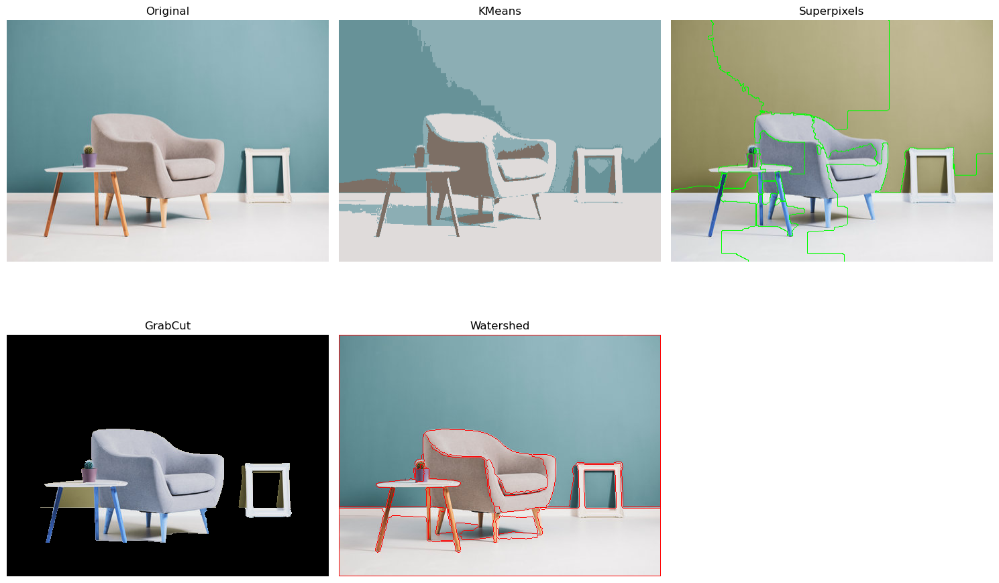

In [26]:
segmentation('segmentation/furniture/chair2.jpg', num_superpixels=15)

For separating chair and frame in the image GrabCut it working the best. Watershed is also giving good boundary of chair and frame

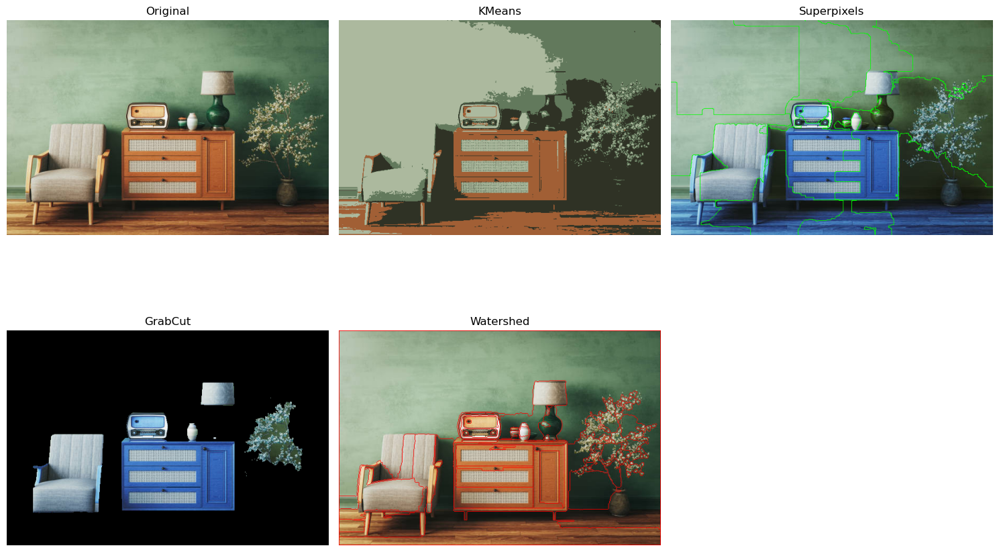

In [31]:
segmentation('segmentation/furniture/chair3.jpg', num_superpixels=50)

For separating objects in the image GrabCut it working the best. Watershed is also giving good boundary of objects

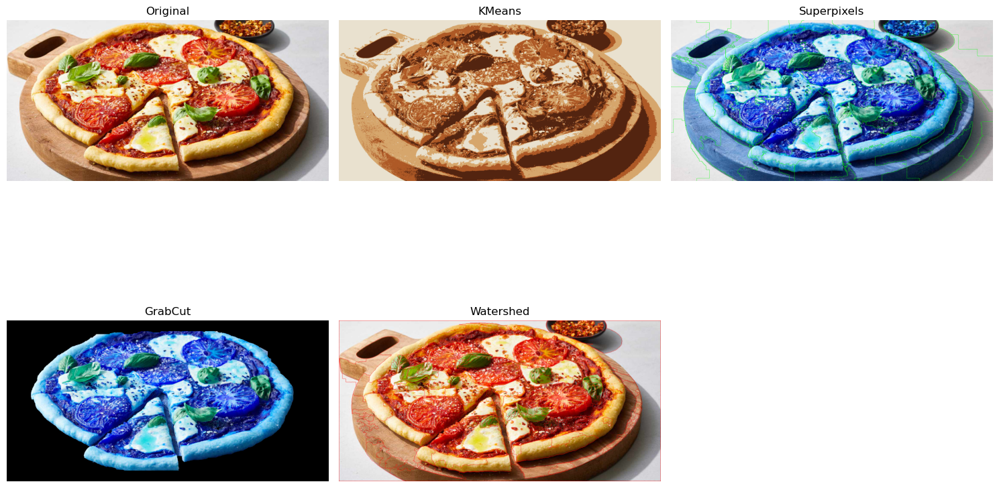

In [33]:
segmentation('segmentation/pizza/pizza1.jpg', num_superpixels=100)

KMeans clustering algorithm is able to separate different things in Pizza, and GrabCut again able to separate the pizza from the background. 

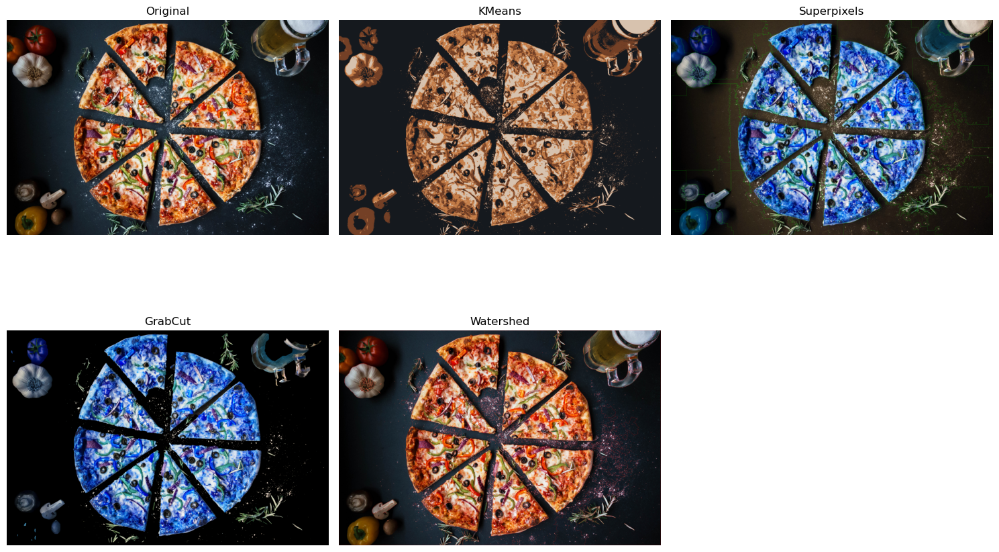

In [34]:
segmentation('segmentation/pizza/pizza2.jpg', num_superpixels=100)

KMeans clustering algorithm is able to separate different things in Pizza, and GrabCut again able to separate the pizza from the background. 

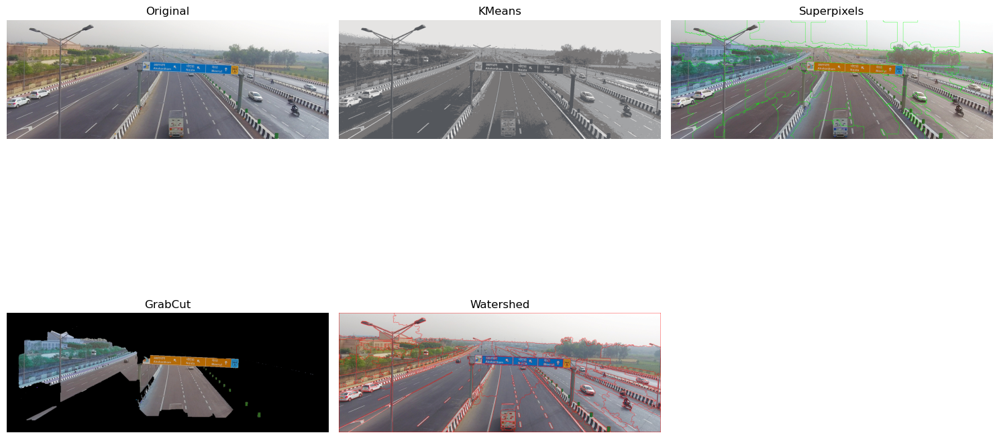

In [38]:
segmentation('segmentation/road/road1.jpg', num_superpixels=80)

Watershed is able to segment the road and the car, but it is not able to segment the road from the sky.

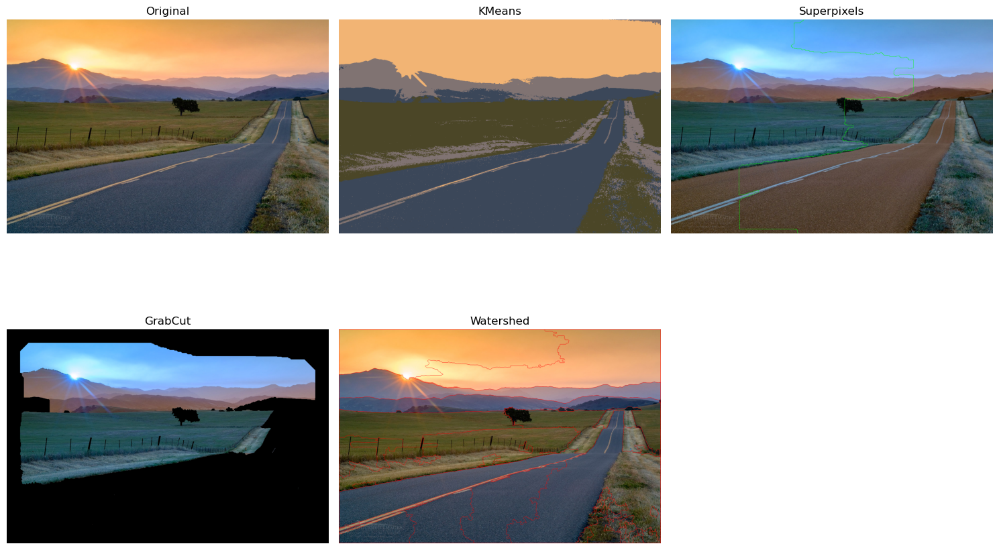

In [39]:
segmentation('segmentation/road/road2.jpg', num_superpixels=15)

KMean is working the best here

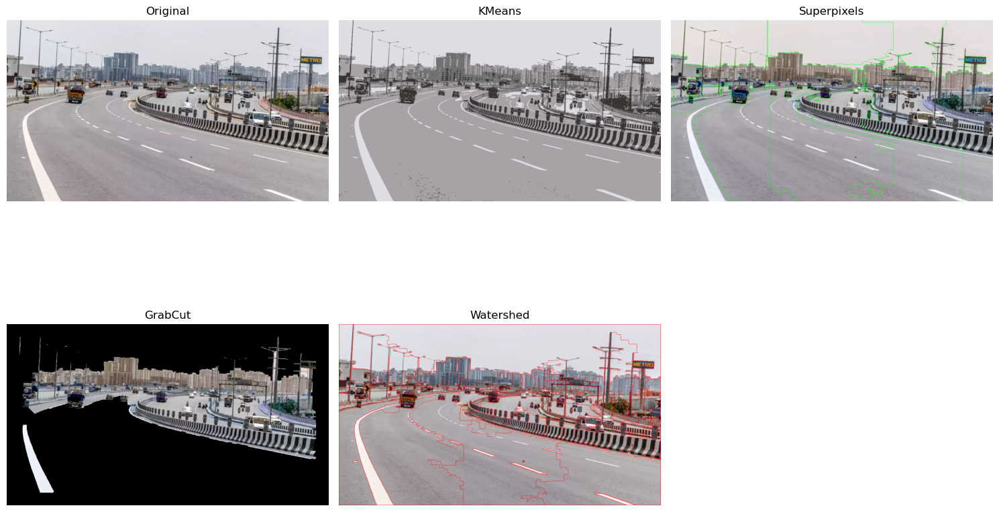

In [41]:
segmentation('segmentation/road/road3.jpg', num_superpixels=50)

KMean is working the best. Watershed is giving the boundaries of the objects in the image. 

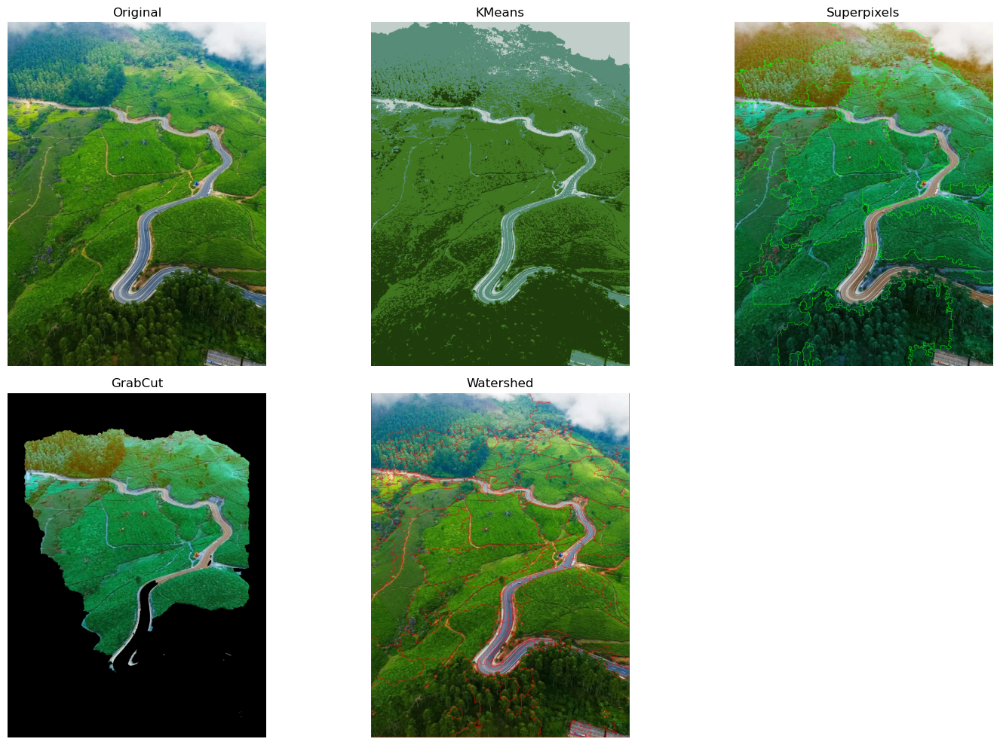

In [42]:
segmentation('segmentation/road/road4.jpg', num_superpixels=15)

Watershed and superpixel segmentations are able to separate the objects in the images, while KMeans and GrabCut are not as effective.